# Time Series Analysis I Assignment

## By Manas Dixit

When it comes to business, time is extremely crucial. Every second is worth money, and every national and global economy is reliant on it. In order to comprehend a variable that varies over time, time series analysis has become an often-used tool in the field of analytics.

Time series data means that data is in a series of particular time periods or intervals. Time series analysis is a specific way of analyzing a sequence of data points collected over an interval of time.

### Introduction

The goal of this exercise is to examine how the closing price and volume-weighted average price of HDFC's shares have changed over time. It begins with data preparation for visualizations and continues with a detailed exploratory data analysis that includes the influence of COVID-19 on HDFC’s stocks, as well as time series model creation and the use of Facebook's new Prophet tool for time series forecasting.

#### About HDFC Bank

The Housing Development Finance Corporation Limited or HDFC was among the first financial institutions in India to receive an “in principle” approval from the Reserve Bank of India (RBI) to set up a bank in the private sector. This was done as part of RBI’s policy for liberalization of the Indian banking industry in 1994.

HDFC Bank was incorporated in August 1994 in the name of HDFC Bank Limited, with its registered office in Mumbai, India. The bank commenced operations as a Scheduled Commercial Bank in January 1995. Currently, it is the biggest private sector bank in India with a market cap of Rs. 8,46,022 crores.

### Import Libraries

In [1]:
#Basic Libraries
import pandas as pd
import numpy as np
import datetime as dt
from datetime import datetime    
from pandas import Series 
import statsmodels.api as sm

#Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
sns.set_style("whitegrid")
%matplotlib inline
import altair as alt 
from pylab import rcParams
rcParams['figure.figsize'] = 20, 10

#ignore warnings
import warnings
warnings.filterwarnings('ignore')

#Timeseries model libraries
from statsmodels.tsa.stattools import adfuller
#pip install pmdarima
from pmdarima import auto_arima
from fbprophet import Prophet

#Performance metric libraries
from sklearn.metrics import mean_absolute_error, mean_squared_error
from fbprophet.diagnostics import cross_validation
from fbprophet.diagnostics import performance_metrics
from fbprophet.plot import plot_cross_validation_metric


import cufflinks
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')

ModuleNotFoundError: No module named 'altair'

In [29]:
#Performance metric libraries
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [33]:
#Performance metric libraries

from fbprophet.diagnostics import cross_validation
from fbprophet.diagnostics import performance_metrics
from fbprophet.plot import plot_cross_validation_metric

#### About the dataset

The dataset used in this project is the price history and trading volumes of HDFC (Housing Development Finance Corporation Limited) Bank, a NIFTY 50 stock from NSE (National Stock Exchange) India. The data is from January 1, 2000, to July 31, 2020.

Here is a quick description of the columns in our dataset:
• Date — Date of trade
• Symbol — Name of the company (HDFC Bank)
• Series — We have only one series (EQ). It stands for Equity. In this series, intraday trading is possible in addition to delivery
• Prev Close — Refers to the prior day’s final price of a security when the market officially closes for the day
• Open — The open is the starting period of trading on a securities exchange or organized over-the-counter market
• High — Highest price at which a stock traded during the course of the trading day
• Low — Lowest price at which a stock traded during the course of the trading day
• Last — The last price of a stock is just one price to consider when buying or selling shares. The last price is simply the most recent one
• Close — The close is a reference to the end of a trading session in the financial markets when the markets close for the day
• VWAP (Volume-weighted average price) — It is the ratio of the value traded to total volume traded over a particular time horizon. It is a measure of the average price at which a stock is traded over the trading horizon
• Volume — It is the amount of a security that was traded during a given period of time
• Turnover — It is a measure of sellers versus buyers of a particular stock. It is calculated by dividing the daily volume of a stock by the “float” of a stock, which is the number of shares available for sale by the general trading public
• Trades — The number of shares being traded on a given day is called trading volumes
• Deliverable Volume — The quantity of shares which actually move from one set of people (who had those shares in their demat account before today and are selling today) to another set of people (who have purchased those shares)
• % Deliverable — Shares which are actually transferred from one person’s demat account to another person’s demat account

### Import dataset

In [2]:
##Import dataset

hdfc_raw=pd.read_csv("HDFCBANK.csv")

## print shape of dataset with rows and columns and information 
print ("The shape of the  data is (row, column):"+ str(hdfc_raw.shape))
print (hdfc_raw.info())

#Checking out the statistical measures
hdfc_raw.describe()

The shape of the  data is (row, column):(5097, 15)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5097 entries, 0 to 5096
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Date                5097 non-null   object 
 1   Symbol              5097 non-null   object 
 2   Series              5097 non-null   object 
 3   Prev Close          5097 non-null   float64
 4   Open                5097 non-null   float64
 5   High                5097 non-null   float64
 6   Low                 5097 non-null   float64
 7   Last                5097 non-null   float64
 8   Close               5097 non-null   float64
 9   VWAP                5097 non-null   float64
 10  Volume              5097 non-null   int64  
 11  Turnover            5097 non-null   float64
 12  Trades              2247 non-null   float64
 13  Deliverable Volume  4588 non-null   float64
 14  %Deliverble         4588 non-null   float64
dtypes: f

,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
count,5097.000000,5097.000000,5097.000000,5097.000000,5097.000000,5097.000000,5097.000000,5.097000e+03,5.097000e+03,2247.000000,4.588000e+03,4588.000000
mean,994.714616,994.963106,1007.384638,981.513302,994.896959,994.892849,994.473841,1.716333e+06,1.939466e+14,68997.182911,1.092479e+06,0.602568
std,644.547489,644.176437,650.255101,638.193293,644.471667,644.441501,644.235252,3.438721e+06,3.996893e+14,82330.803166,1.897500e+06,0.117206
min,157.400000,162.150000,167.900000,157.000000,163.000000,163.400000,161.400000,1.042000e+03,2.291142e+10,807.000000,4.631000e+03,0.177900
25%,459.700000,460.150000,467.850000,452.650000,460.800000,460.500000,460.780000,2.832300e+05,1.429500e+13,25726.000000,2.483295e+05,0.530000
50%,885.850000,884.000000,902.000000,868.250000,887.800000,885.900000,884.490000,8.777020e+05,1.085050e+14,40589.000000,5.950735e+05,0.606900
75%,1406.250000,1405.000000,1425.000000,1378.600000,1406.650000,1406.250000,1403.020000,1.928625e+06,1.983820e+14,77716.500000,1.264189e+06,0.677425
max,2565.800000,2566.000000,2583.300000,2553.700000,2563.000000,2565.800000,2570.700000,1.005650e+08,1.430000e+16,790631.000000,6.669683e+07,1.000000


In [3]:
hdfc_raw.head()

,Date,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
0,1/3/2000,HDFCBANK,EQ,157.40,166.00,170.00,166.00,170.00,170.00,169.52,33259,5.638120e+11,NaN,NaN,NaN
1,1/4/2000,HDFCBANK,EQ,170.00,182.00,183.45,171.00,174.00,173.80,174.99,168710,2.952260e+12,NaN,NaN,NaN
2,1/5/2000,HDFCBANK,EQ,173.80,170.00,173.90,165.00,168.00,166.95,169.20,159820,2.704090e+12,NaN,NaN,NaN
3,1/6/2000,HDFCBANK,EQ,166.95,168.00,170.00,165.30,168.95,168.30,168.44,85026,1.432170e+12,NaN,NaN,NaN
4,1/7/2000,HDFCBANK,EQ,168.30,162.15,171.00,162.15,170.75,168.35,166.79,85144,1.420160e+12,NaN,NaN,NaN


In [4]:
hdfc_raw.dtypes

Date                   object
Symbol                 object
Series                 object
Prev Close            float64
Open                  float64
High                  float64
Low                   float64
Last                  float64
Close                 float64
VWAP                  float64
Volume                  int64
Turnover              float64
Trades                float64
Deliverable Volume    float64
%Deliverble           float64
dtype: object

## Data Preparation

Before we begin to visualize our data and build and apply models, it is important to cleanse the data. In our dataset, thankfully, we only have a few null values that we need to get rid of.

We will also use the time to extract a few more features to perform in-depth Exploratory Data Analysis (EDA), as can be seen below.

In [5]:
#Creating a copy
hdfc_analysis=hdfc_raw.copy()

#Coverting date column to datetime data type
hdfc_analysis['Date'] = hdfc_analysis['Date'].apply(pd.to_datetime)

#Extracting Month, Week, Day,Day of week
hdfc_analysis["Month"] = hdfc_analysis.Date.dt.month
hdfc_analysis["Week"] = hdfc_analysis.Date.dt.week
hdfc_analysis["Day"] = hdfc_analysis.Date.dt.day
hdfc_analysis["Day of week"] = hdfc_analysis.Date.dt.dayofweek


#Setting date column as index
hdfc_analysis.set_index("Date", drop=False, inplace=True)
hdfc_analysis.iloc[:,15:19].head()

<ipython-input-5-090ec6fe58da>:9: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  hdfc_analysis["Week"] = hdfc_analysis.Date.dt.week


,Month,Week,Day,Day of week
Date,,,,
2000-01-03,1,1,3,0
2000-01-04,1,1,4,1
2000-01-05,1,1,5,2
2000-01-06,1,1,6,3
2000-01-07,1,1,7,4


In [6]:
#Imputing null values with mean 
hdfc_analysis.fillna(hdfc_analysis.mean(),inplace=True)

#Checking for null values
hdfc_analysis.isnull().sum()

<ipython-input-6-e96b3971b556>:2: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  hdfc_analysis.fillna(hdfc_analysis.mean(),inplace=True)


Date                  0
Symbol                0
Series                0
Prev Close            0
Open                  0
High                  0
Low                   0
Last                  0
Close                 0
VWAP                  0
Volume                0
Turnover              0
Trades                0
Deliverable Volume    0
%Deliverble           0
Month                 0
Week                  0
Day                   0
Day of week           0
dtype: int64

## Data Visualization

Now we will visualize our data in the form of line charts to understand the trend, seasonality and other notable time series analysis concepts.

C:\Users\Asus\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Asus\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Asus\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level 

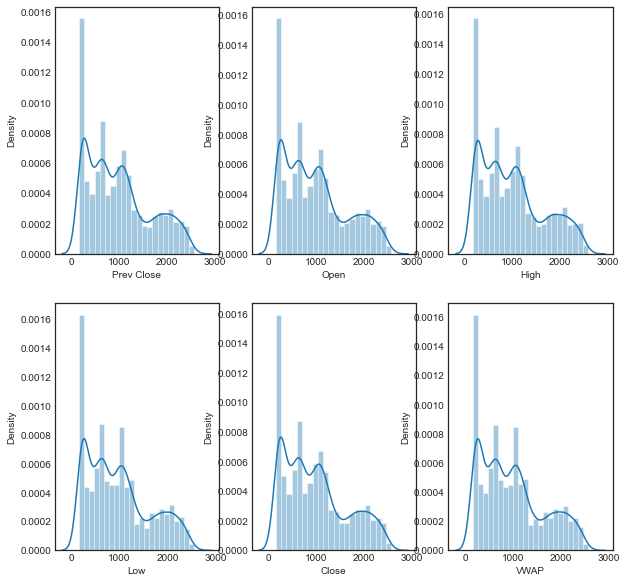

In [7]:
#Size and style of the plot
plt.figure(figsize = (15, 7))
plt.style.use('seaborn-white')

#Subplots of distplot
plt.subplot(231)
sns.distplot(hdfc_analysis['Prev Close'])
fig = plt.gcf()
fig.set_size_inches(10,10)

plt.subplot(232)
sns.distplot(hdfc_analysis['Open'])
fig = plt.gcf()
fig.set_size_inches(10,10)

plt.subplot(233)
sns.distplot(hdfc_analysis['High'])
fig = plt.gcf()
fig.set_size_inches(10,10)

plt.subplot(234)
sns.distplot(hdfc_analysis['Low'])
fig = plt.gcf()
fig.set_size_inches(10,10)

plt.subplot(235)
sns.distplot(hdfc_analysis['Close'])
fig = plt.gcf()
fig.set_size_inches(10,10)

plt.subplot(236)
sns.distplot(hdfc_analysis['VWAP'])
fig = plt.gcf()
fig.set_size_inches(10,10)

In [8]:
# VWAP over time

fig = px.line(hdfc_analysis, x='Date', y='VWAP',title='VWAP over Years(Use Rangeslider to slide over time)')
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

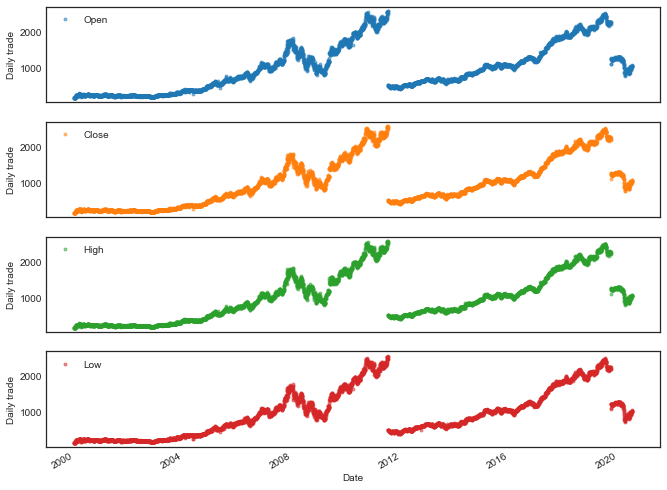

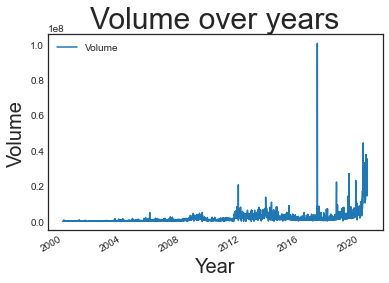

In [9]:
# Uni-variate analysis of Open,Close,High and Low

cols_plot = ['Open', 'Close', 'High','Low']
axes = hdfc_analysis[cols_plot].plot(marker='.', alpha=0.5, linestyle='None', figsize=(11, 9), subplots=True)
for ax in axes:
    ax.set_ylabel('Daily trade')

# Uni-variate analysis of Volume of share over the years

ax=hdfc_analysis[['Volume']].plot(stacked=True)
ax.set_title('Volume over years',fontsize= 30)
ax.set_xlabel('Year',fontsize = 20)
ax.set_ylabel('Volume',fontsize = 20)
plt.show()

## Moving Average Analysis

Moving average is a smoothing technique applied to time series to remove the fine-grained variation between time steps. The hope of smoothing is to remove noise and better expose the signal of the underlying causal processes. Moving averages are a simple and common type of smoothing used in time series analysis and time series forecasting. Calculating a moving average involves creating a new series where the values are comprised of the average of raw observations in the original time series. A moving average requires that you specify a window size called the window width. This defines the number of raw observations used to calculate the moving average value. The “moving” part in the moving average refers to the fact that the window defined by the window width is slid along the time series to calculate the average values in the new series.

We have created the moving average and standard deviation for the respective days across High, Low, Volume, VWAP.

In [10]:
#Making a copy
hdfc_lag=hdfc_analysis.copy()
#Reset index
hdfc_lag.reset_index(drop=True, inplace=True)
#Creating lag features
lag_features = ["High", "Low", "Volume", "VWAP"]

# Taking the number of days in window
window1 = 3
window2 = 7
window3 = 30

#Rolling mean
df_rolled_3d = hdfc_lag[lag_features].rolling(window=window1, min_periods=0)
df_rolled_7d = hdfc_lag[lag_features].rolling(window=window2, min_periods=0)
df_rolled_30d = hdfc_lag[lag_features].rolling(window=window3, min_periods=0)

#Moving average
df_mean_3d = df_rolled_3d.mean().shift(1).reset_index().astype(np.float32)
df_mean_7d = df_rolled_7d.mean().shift(1).reset_index().astype(np.float32)
df_mean_30d = df_rolled_30d.mean().shift(1).reset_index().astype(np.float32)

#Standard deviation
df_std_3d = df_rolled_3d.std().shift(1).reset_index().astype(np.float32)
df_std_7d = df_rolled_7d.std().shift(1).reset_index().astype(np.float32)
df_std_30d = df_rolled_30d.std().shift(1).reset_index().astype(np.float32)

# Adding the features to the dataframe
for feature in lag_features:
    hdfc_lag[f"{feature}_mean_lag{window1}"] = df_mean_3d[feature]
    hdfc_lag[f"{feature}_mean_lag{window2}"] = df_mean_7d[feature]
    hdfc_lag[f"{feature}_mean_lag{window3}"] = df_mean_30d[feature]
    
    hdfc_lag[f"{feature}_std_lag{window1}"] = df_std_3d[feature]
    hdfc_lag[f"{feature}_std_lag{window2}"] = df_std_7d[feature]
    hdfc_lag[f"{feature}_std_lag{window3}"] = df_std_30d[feature]

hdfc_lag.fillna(hdfc_lag.mean(), inplace=True)

#Setting Date as index
hdfc_lag.set_index("Date", drop=False, inplace=True)
hdfc_lag.head()

<ipython-input-10-70e2c054ec07>:38: FutureWarning:

DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.



,Date,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,...,Volume_mean_lag30,Volume_std_lag3,Volume_std_lag7,Volume_std_lag30,VWAP_mean_lag3,VWAP_mean_lag7,VWAP_mean_lag30,VWAP_std_lag3,VWAP_std_lag7,VWAP_std_lag30
Date,,,,,,,,,,,,,,,,,,,,,
2000-01-03,2000-01-03,HDFCBANK,EQ,157.40,166.00,170.00,166.00,170.00,170.00,169.52,...,1.651512e+06,569111.000000,695677.312500,898106.500000,994.284729,993.944580,992.096436,10.809008,17.445614,38.774673
2000-01-04,2000-01-04,HDFCBANK,EQ,170.00,182.00,183.45,171.00,174.00,173.80,174.99,...,3.325900e+04,569111.000000,695677.312500,898106.500000,169.520004,169.520004,169.520004,10.809008,17.445614,38.774673
2000-01-05,2000-01-05,HDFCBANK,EQ,173.80,170.00,173.90,165.00,168.00,166.95,169.20,...,1.009845e+05,95778.320312,95778.320312,95778.320312,172.255005,172.255005,172.255005,3.867874,3.867874,3.867874
2000-01-06,2000-01-06,HDFCBANK,EQ,166.95,168.00,170.00,165.30,168.95,168.30,168.44,...,1.205963e+05,75766.851562,75766.851562,75766.851562,171.236664,171.236664,171.236664,3.254417,3.254417,3.254417
2000-01-07,2000-01-07,HDFCBANK,EQ,168.30,162.15,171.00,162.15,170.75,168.35,166.79,...,1.117038e+05,45964.089844,64369.164062,64369.164062,170.876663,170.537506,170.537506,3.582462,3.002692,3.002692


In [11]:
#Printing the high curve
fig = go.Figure()
fig.add_trace(go.Scatter(
         x=hdfc_lag['Date'],
         y=hdfc_lag['High'],
         name='High',
    line=dict(color='green'),
    opacity=0.8))

#Printing the low curve
fig.add_trace(go.Scatter(
         x=hdfc_lag['Date'],
         y=hdfc_lag['Low'],
         name='Low',
    line=dict(color='orange'),
    opacity=0.8))

#Printing the high lag mean-30 days curve
fig.add_trace(go.Scatter(
         x=hdfc_lag['Date'],
         y=hdfc_lag['High_mean_lag30'],
         name='High_mean_lag30',
    line=dict(color='red'),
    opacity=0.8))

#Printing the high lag standard deviation-30 days curve
fig.add_trace(go.Scatter(
         x=hdfc_lag['Date'],
         y=hdfc_lag['High_std_lag30'],
         name='High_std_lag30',
    line=dict(color='royalblue'),
    opacity=0.8))

#Printing the low lag mean-30 days curve
fig.add_trace(go.Scatter(
         x=hdfc_lag['Date'],
         y=hdfc_lag['Low_mean_lag30'],
         name='Low_mean_lag30',
    line=dict(color='yellow'),
    opacity=0.8))

#Printing the low lag standard deviation-30 days curve
fig.add_trace(go.Scatter(
         x=hdfc_lag['Date'],
         y=hdfc_lag['Low_std_lag30'],
         name='Low_std_lag30',
    line=dict(color='pink'),
    opacity=0.8))

#Updating the time axis
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
        
#Update the title   
fig.update_layout(title_text='High Vs Low with mean lag and standard deviation lag',plot_bgcolor='rgb(248, 248, 255)',yaxis_title='Value')

fig.show()

In [12]:
#Printing the Volume curve
fig = go.Figure()
fig.add_trace(go.Scatter(
         x=hdfc_lag['Date'],
         y=hdfc_lag['Volume'],
         name='Volume',
    line=dict(color='green'),
    opacity=0.8))

#Printing the Volume_mean_lag-30 days curve
fig.add_trace(go.Scatter(
         x=hdfc_lag['Date'],
         y=hdfc_lag['Volume_mean_lag30'],
         name='Volume_mean_lag30',
    line=dict(color='yellow'),
    opacity=0.8))
#Printing the Volume_std_lag30 curve
fig.add_trace(go.Scatter(
         x=hdfc_lag['Date'],
         y=hdfc_lag['Volume_std_lag30'],
         name='Volume_std_lag30',
    line=dict(color='blue'),
    opacity=0.8))

#Updating time axis
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
        
#Updating layout 
fig.update_layout(title_text='Volume with mean lag and standard deviation lag',plot_bgcolor='rgb(248, 248, 255)',yaxis_title='Value')

fig.show()
2005

2005

## Impact of COVID-19

In [14]:
# COVID-19 Impact

# Performance after lockdown-VWAP

fig = px.line(hdfc_analysis, x='Date', y='VWAP',title='VWAP after lockdown', range_x=['2020-03-23','2020-06-30'])
fig.show()

# Candlestick after Lockdown (Open,Close,High,Low)

hdfc_analysis_lockdown = hdfc_analysis[hdfc_analysis['Date'] >= '2020-03-23']
fig = go.Figure(data=[go.Candlestick(x=hdfc_analysis_lockdown['Date'],
                open=hdfc_analysis_lockdown['Open'],
                high=hdfc_analysis_lockdown['High'],
                low=hdfc_analysis_lockdown['Low'],
                close=hdfc_analysis_lockdown['Close'])])

fig.show()

In [15]:
#Setting the range of base plot
fig = px.line(hdfc_analysis, x='Date', y='Volume',title='Volume during Phase 1 Lockdown(25 March – 14 April) and Phase 2 Lockdown (15 April – 3 May)', range_x=['2020-01-01','2020-06-30'])

# Adding the shape in the dates
fig.update_layout(
    shapes=[
        # First phase Lockdown
        dict(
            type="rect",
            xref="x",
            yref="paper",
            x0="2020-03-23",
            y0=0,
            x1="2020-04-14",
            y1=1,
            fillcolor="LightSalmon",
            opacity=0.5,
            layer="below",
            line_width=0,
        ),
        # Second phase Lockdown
        dict(
            type="rect",
            xref="x",
            yref="paper",
            x0="2020-04-15",
            y0=0,
            x1="2020-05-03",
            y1=1,
            fillcolor="Green",
            opacity=0.5,
            layer="below",
            line_width=0,
        )],
    annotations=[dict(x='2020-04-15', y=0.99, xref='x', yref='paper',
                    showarrow=False, xanchor='right', text='Phase 1 Lockdown'),
                 dict(x='2020-05-12', y=0.99, xref='x', yref='paper',
                    showarrow=False, xanchor='right', text='Phase 2 Lockdown')])

fig.show()

## Stationarity

A common assumption in many time series techniques is that the data are stationary. A stationary process has the property that the mean, variance and auto-correlation structure do not change over time.

While there are many ways to check the stationarity of a time series, we only look at two ways to check the stationary of our time series.

The first is by looking at the data. By visualizing the data, it should be easy to identify a changing mean or variation in the data. For a more accurate assessment there is the Dickey-Fuller test.

<AxesSubplot:xlabel='Date'>

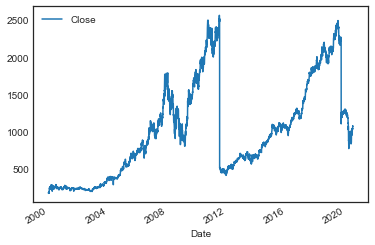

In [17]:
# Visually checking for stationarity

hdfc_stationarity=hdfc_analysis[['Close']]
hdfc_stationarity.plot()

In [19]:
# Augmented Dickey Fuller Test

#Ho: Data is non stationary
#H1: Data is stationary

def adfuller_test(price):
    result=adfuller_test(price)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")

adfuller_test(hdfc_stationarity['Close'])

RecursionError: maximum recursion depth exceeded

In [27]:
# Augmented Dickey Fuller Test

#Ho: Data is non stationary
#H1: Data is stationary

def adfuller_test(price):
    result=adfuller(price)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")

adfuller_test(hdfc_stationarity['Close'])

ADF Test Statistic : -2.287306605903843
p-value : 0.176094530447718
#Lags Used : 0
Number of Observations Used : 5096
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


<ipython-input-20-6b6968369086>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<AxesSubplot:xlabel='Date'>

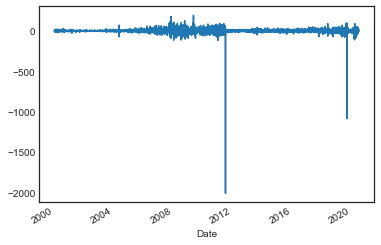

In [20]:
# Stationarity Conversion with shift()

hdfc_stationarity['Close First Difference']=hdfc_stationarity['Close']-hdfc_stationarity['Close'].shift(1)
hdfc_stationarity['Close First Difference'].plot()

## Model Building – Forecasting & Prediction

Now we arrive at the most important phase of the project, which is essentially the objective of taking it up in the first place.
For model building, we are considering the close price feature as it is very reliable for prediction. VWAP is a derived/calculated value which doesn’t make much sense while getting forecast value.

### AUTO ARIMA – Autoregressive Integrated Moving Average

ARIMA stands for ‘Auto Regressive Integrated Moving Average’ is actually a class of models that ‘explains’ a given time series based on its own past values, that is, its own lags and the lagged forecast errors, so that equation can be used to forecast future values.

Any ‘non-seasonal’ time series that exhibits patterns and is not a random white noise can be modeled with ARIMA models.

An ARIMA model is characterized by 3 terms: p, d, q
where,
p is the order of the AR term
q is the order of the MA term
d is the number of differencing required to make the time series stationary
If a time series, has seasonal patterns, then you need to add seasonal terms and it becomes SARIMA, short for ‘Seasonal ARIMA’.

### Building AUTO ARIMA Model

For building the AUTO ARIMA model, we first split our training and testing data. For time series analysis we step back from using train test split as our data involves time and splitting can cause the mix of date across both train and test dataset which is vulnerable for a data leakage. So, we split based on the dates. Here, we split the training and validation data based on the year 2019 where the data before 2019 is training data and data after 2019 is validation data.

We train our model with AUTO ARIMA. Here the model selects the parameter p, q, and d value in a normal ARIMA model by itself by determining AIC value (Akaike Information Criterion). AIC estimates the relative amount of information lost by a given model: the less information a model loses, the higher the quality of that model. AUTO ARIMA prefers the parameters which can reap less information loss.

In [21]:
# Building AUTO ARIMA mode

train = hdfc_lag[hdfc_lag.Date < "2019"]
valid = hdfc_lag[hdfc_lag.Date >= "2019"]

#Consider the new features created as exogenous_features
exogenous_features = ['High_mean_lag3','High_mean_lag7', 'High_mean_lag30', 'High_std_lag3', 'High_std_lag7',
       'High_std_lag30', 'Low_mean_lag3', 'Low_mean_lag7', 'Low_mean_lag30',
       'Low_std_lag3', 'Low_std_lag7', 'Low_std_lag30', 'Volume_mean_lag3',
       'Volume_mean_lag7', 'Volume_mean_lag30', 'Volume_std_lag3',
       'Volume_std_lag7', 'Volume_std_lag30', 'VWAP_mean_lag3',
       'VWAP_mean_lag7', 'VWAP_mean_lag30', 'VWAP_std_lag3', 'VWAP_std_lag7',
       'VWAP_std_lag30','Month', 'Week', 'Day', 'Day of week']

In [25]:
#Timeseries model libraries
from statsmodels.tsa.stattools import adfuller
#pip install pmdarima
from pmdarima import auto_arima
from fbprophet import Prophet

ModuleNotFoundError: No module named 'fbprophet'

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=48100.711, Time=26.54 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=48598.238, Time=7.90 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=48164.905, Time=18.05 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=48109.759, Time=26.44 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=83882.569, Time=6.56 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=48115.424, Time=27.96 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=48102.361, Time=24.44 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=48099.789, Time=28.85 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=48106.553, Time=31.20 sec
 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=48101.286, Time=33.51 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=48100.740, Time=30.15 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=48098.969, Time=28.65 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=48101.190, Time=30.30 sec
 ARIMA(2,0,4)(0,0,0)[0] intercept   : AIC=48100.400, Time=34.79 sec
 ARIMA(

C:\Users\Asus\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:376: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

<ipython-input-26-7c280af97fe8>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<AxesSubplot:xlabel='Date'>

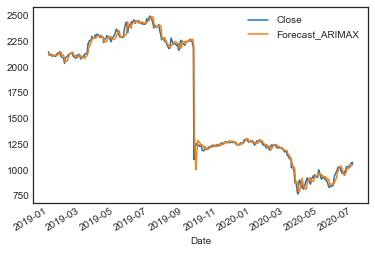

In [26]:
model = auto_arima(train.Close, exogenous=train[exogenous_features], trace=True, error_action="ignore", suppress_warnings=True)
model.fit(train.Close, exogenous=train[exogenous_features])

valid["Forecast_ARIMAX"] = model.predict(n_periods=len(valid), exogenous=valid[exogenous_features])

# Plotting the forecasted values with the actual data
valid[["Close", "Forecast_ARIMAX"]].plot()

In [30]:
# Performance metrics-RMSE and MAE

print("RMSE of Auto ARIMAX:", np.sqrt(mean_squared_error(valid.Close, valid.Forecast_ARIMAX)))
print("\nMAE of Auto ARIMAX:", mean_absolute_error(valid.Close, valid.Forecast_ARIMAX))

RMSE of Auto ARIMAX: 67.82958043595664

MAE of Auto ARIMAX: 26.95611741001754


## FB Prophet

Facebook developed an open sourcing Prophet, a forecasting tool available in both Python and R. It provides intuitive parameters which are easy to tune. Even someone who lacks deep expertise in time-series forecasting models can use this to generate meaningful predictions for a variety of problems in business scenarios.

We have created the future dataframe for 365 days. Since our dataset is till July 2020 only, we have dates till 2021 and now we are going to predict the stock prices for that.

In [31]:
from fbprophet import Prophet

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 34 forecasts with cutoffs between 2003-03-27 00:00:00 and 2019-07-01 00:00:00


  0%|          | 0/34 [00:00<?, ?it/s]

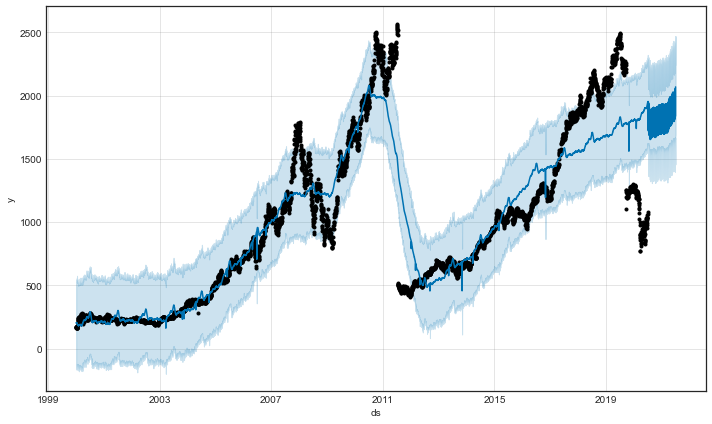

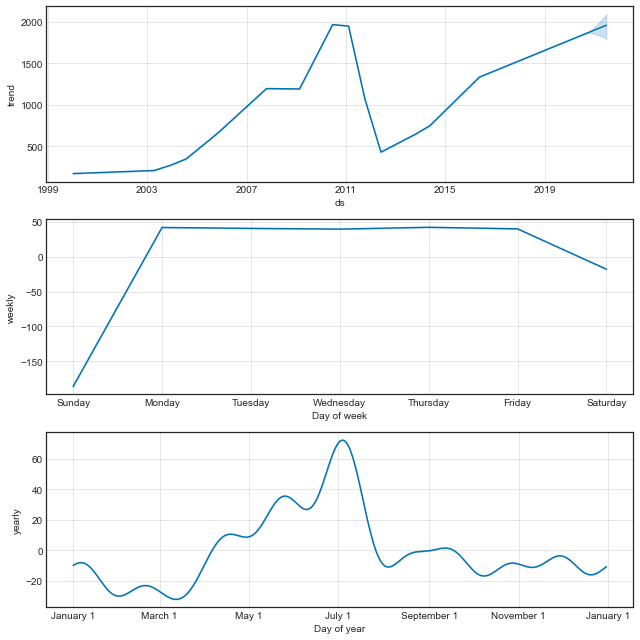

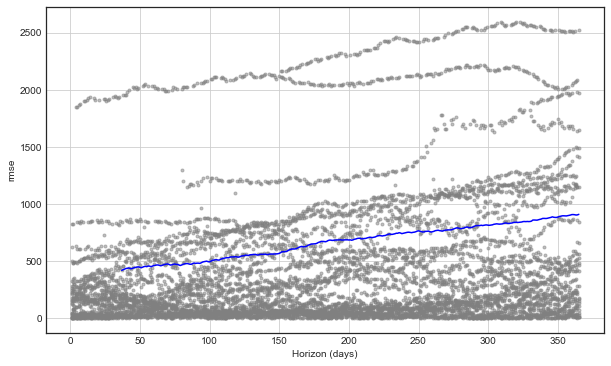

In [34]:
### intiialize the Model
model=Prophet()

#Fitting the model and renaming the columns based on prophe requirements
model.fit(hdfc_analysis[["Date", "Close"]].rename(columns={"Date": "ds", "Close": "y"}))

#Making future dataframe for forecasting, we have given 365 days which can calculate VWAP till 2021
hdfc_future=model.make_future_dataframe(periods=365)

#Checking the future dates
hdfc_future.tail()

### Prediction of future values
hdfc_prediction=model.predict(hdfc_future)

hdfc_prediction.tail()

#Forecast plot
model.plot(hdfc_prediction)

#Forecast components
model.plot_components(hdfc_prediction)

#Cross validation for the parameter days
hdfc_cv=cross_validation(model,initial='1095 days',period='180 days',horizon="365 days")

#Checking the parameters
hdfc_performance=performance_metrics(hdfc_cv)
hdfc_performance.head()


#Plotting for root mean squared metric
fig=plot_cross_validation_metric(hdfc_cv,metric='rmse')

## Conclusion

From our time series analysis of HDFC Bank, we saw how the company has evolved over the years to establish itself as the country’s largest private sector bank with annual revenue touching Rs. 1.21 lakh crores in 2021.

### Thank you!